In this notebook, we download some data originally taken from the Allen Brain Observatory, which features two-photon neural recordings from visual cortical areas in mice viewing a variety of visual stimuli. The data being downloaded here has been preprocessed somewhat and represents a tiny subset of all of the data available in the Allen dataset. In particular, data from only one mouse is provided for each session type. More information about the experiments and the full dataset can be found here: https://allensdk.readthedocs.io/en/latest/brain_observatory.html

-- JM Murray, https://murraylab.uoregon.edu

In [ ]:
import numpy as np
import matplotlib.pyplot as plt

# Loading the saved data

Below we download the data, which has been saved in .npz files. The data come from four different experimental sessions in which different types of visual stimuli were shown (including one session where spontaneous neural activity was recorded in the absence of any visual stimulus). The data consist of numpy arrays that give information about the stimulus and the neural activity.

**Note**: The data from the drifting gratings and the spontaneous activity sessions were recorded from the same neurons in the same mouse ("Mouse A"). Likewise, the data from the static gratings and the natural scenes sessions were recorded from the same neurons in the same mouse ("Mouse B"). This could be useful to know in case, for example, you wanted to compare a neuron's responses to drifting gratings to the same neuron's spontaneous activity (which would be fine, since both sets of data come from Mouse A), or if you wanted to compare a neuron's responses to static gratings to the same neuron's spontaneous activity (which could *not* be done here, since those data involve different neurons in different mice).

How to load the data depends on whether you are running this notebook in the cloud with Colab or as a Jupyter notebook on your local machine (e.g. if you downloaded the Anaconda distribution of Python). Please read the instructions below for these two cases carefully. Note that you may not want to download all of the .npz files to your computer, since this is in total nearly 1 gigabyte of data and may take some time. Note also, though, that you won't be able to run some of the cells below if you haven't loaded the data that they depend on.
1. If you are running this notebook on your local machine, then, in order for this notebook to load the data, make sure that the .npz files are in the same directory as this notebook file (or modify the `np.load` commands below to include the correct path to where these files are located).
2. If you are running this notebook in the cloud with Colab, save the .npz files with the data that you want somewhere on your computer, then run the two lines of code below and use the file browser to select the .npz files with the data that you want.

In [ ]:
# Run this code if you are using Colab and use it to select the data that you want.
# from google.colab import files
# uploaded = files.upload()

# Load the Drive helper and mount
from google.colab import drive

# This will prompt for authorization.
drive.mount('/content/drive', force_remount=True)

Mounted at /content/drive


In [ ]:
import os
print(os.getcwd())
# os.chdir("drive/My Drive/Final_Project")

/content


## Drifting gratings

For the drifting gratings dataset, moving patterns of black and white stripes (also known as "gratings") were presented in a sequence of trials, with each trial lasting 2s in duration. More information about the stimuli can be found here:
http://observatory.brain-map.org/visualcoding/stimulus/drifting_gratings

The drifting gratings dataset contains three pieces:

- `drifting_gratings['orientation']` is a 1D numpy array, where each entry gives the stimulus orientation in degrees for a particular trial.
- `drifting_gratings['temporal_frequency']` is a 1D numpy array, where each entry gives the temporal frequency of the stimulus for a particular trial.
- `drifting_gratings['dff']` is a 2D numpy array of size `n_neurons` by `n_trials`, where each entry gives the activity ("delta f over f", or "dff") of a particular neuron for a particular trial. The activity given here is the average of the neural activity over the duration of the stimulus.

In [ ]:
drifting_gratings = np.load('drifting_gratings.npz')
drifting_gratings.files

['orientation', 'temporal_frequency', 'dff']

In [ ]:
# We can, for example, look at the orientation of the grating in the first ten trials:
drifting_gratings['orientation'][:10]

array([ 90.,   0., 225.,  90., 225.,   0.,   0.,  45., 135., 180.])

In [ ]:
np.shape(drifting_gratings['dff'])

(52, 598)

Text(0, 0.5, 'dff')

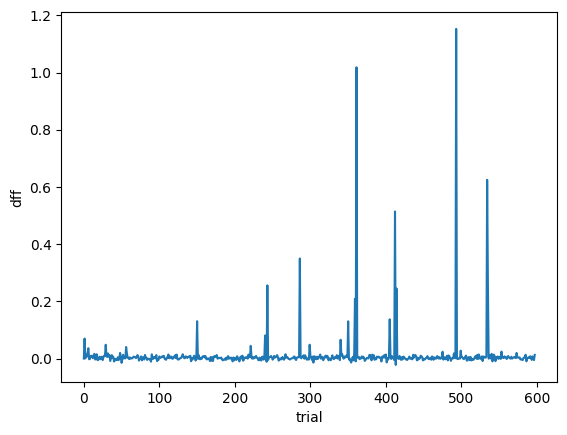

In [ ]:
plt.plot(drifting_gratings['dff'][1,:])
plt.xlabel('trial')
plt.ylabel('dff')

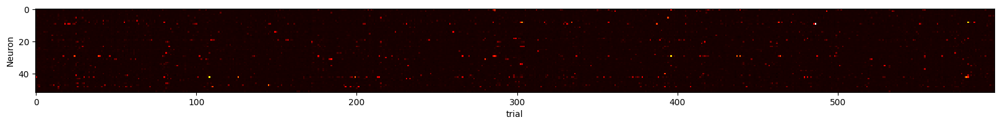

In [ ]:
plt.figure(figsize=(20,12))
plt.imshow(drifting_gratings['dff'], cmap='hot', interpolation='nearest')
plt.xlabel('trial')
plt.ylabel('Neuron')
plt.show()

In [ ]:
neuron = 0
activity = drifting_gratings['dff'][neuron,:]
mask = drifting_gratings['orientation'] == 315
print(mask[:20])
print(len(activity[mask]))
print(len(activity))

[False False False False False False False False False False False False
 False False False False False  True False False]
75
598


Text(0, 0.5, 'dff')

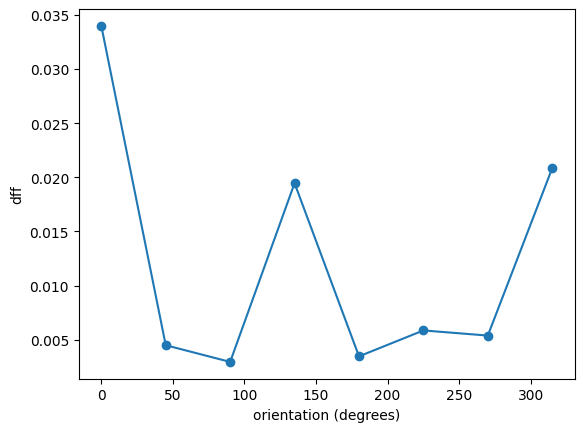

In [ ]:
# np.unique(drifting_gratings['orientation'])
neuron = 1
activity = drifting_gratings['dff'][neuron,:]

orientations = np.arange(0, 360, 45)
neuron_dffs = np.zeros((len(orientations)))

for i in range(len(orientations)):
  mask = drifting_gratings['orientation'] == orientations[i]
  neuron_dffs[i] = np.mean(activity[mask])


plt.plot(orientations, neuron_dffs, '-o')
plt.xlabel('orientation (degrees)')
plt.ylabel('dff')

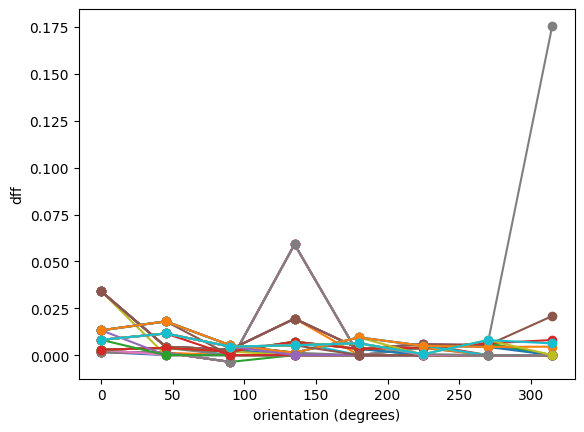

In [ ]:
def tuning_curve(neuron):
  activity = drifting_gratings['dff'][neuron,:]

  orientations = np.arange(0, 360, 45)
  neuron_dffs = np.zeros((len(orientations)))

  for i in range(len(orientations)):
    mask = drifting_gratings['orientation'] == orientations[i]
    neuron_dffs[i] = np.mean(activity[mask])

    plt.plot(orientations, neuron_dffs, '-o')
    plt.xlabel('orientation (degrees)')
    plt.ylabel('dff')

for i in range(5):
  tuning_curve(i)

## Spontaneous activity

The spontaneous activity dataset consists of neural activity in the absence of any visual stimulus. Unlike the data from the other three sessions, the data in this case is not averaged over time. 

The spontaneous activity dataset consists of two pieces:
- `spontaneous['dff']` is a 2D numpy array of size `n_neurons` by `n_timesteps`, where each entry gives the activity ("delta f over f", or "dff") of a particular neuron at a particular time.
- `spontaneous['times']` is a 1D numpy array of size `n_timesteps` that gives the time (in seconds) of each timestep.

In [ ]:
spontaneous = np.load('spontaneous.npz')
spontaneous.files

['dff', 'times']

In [ ]:
from mpl_toolkits.mplot3d import Axes3D
from sklearn.decomposition import PCA
from matplotlib.animation import FuncAnimation
from matplotlib import rc
from IPython.display import display
rc('animation', html='jshtml')

data = spontaneous['dff'][:,:100].T

# perform PCA
pca = PCA(n_components=3)
pca.fit(data)
pca_components = pca.transform(data)

#create or figure
fig = plt.figure()
ax = fig.add_subplot(111,projection='3d')

#set initial plot
sc = ax.scatter([],[],[],c='b',marker='o',alpha=1.0)
line, = ax.plot([],[],[],c='r')

#set up the axis limits
ax.set_xlim(np.min(pca_components[:,0]), np.max(pca_components[:,0]))
ax.set_ylim(np.min(pca_components[:,1]), np.max(pca_components[:,1]))
ax.set_zlim(np.min(pca_components[:2]), np.max(pca_components[:,2]))

#animation update function

def update(frame):
  sc._offsets3d = (pca_components[:frame, 0], pca_components[:frame, 1], pca_components[:frame, 2])
  line.set_data(pca_components[max(0, frame - 50):frame, 0], pca_components[max(0, frame - 50):frame, 1])
  line.set_3d_properties(pca_components[max(0, frame - 50):frame, 2])
  sc.set_alpha(1.0 - frame / len(data)) #set transparency animation on scatter plot
  return sc, line


#animate something
anim = FuncAnimation(fig, update, frames=len(data), interval=200, blit=True, repeat=False)
plt.close()

display(anim)


## Static gratings

For the static gratings dataset, patterns of black and white stripes (also known as "gratings") were presented in a sequence of trials, with each trial lasting 2s in duration. More information about the stimuli can be found here:
http://observatory.brain-map.org/visualcoding/stimulus/static_gratings

The static gratings dataset contains four pieces:

- `static_gratings['orientation']` is a 1D numpy array, where each entry gives the stimulus orientation in degrees for a particular trial.
- `static_gratings['spatial_frequency']` is a 1D numpy array, where each entry gives the spatial frequency of the stimulus for a particular trial.
- `static_gratings['phase']` is a 1D numpy array, where each entry gives the phase (in multiples of '$2\pi$') of the stimulus for a particular trial.
- `static_gratings['dff']` is a 2D numpy array of size `n_neurons` by `n_trials`, where each entry gives the activity ("delta f over f", or "dff") of a particular neuron for a particular trial. The activity given here is the average of the neural activity over the duration of the stimulus.

In [ ]:
static_gratings = np.load('static_gratings.npz')
static_gratings.files

['orientation', 'spatial_frequency', 'phase', 'dff']

In [ ]:
# We can, for example, look at the spatial frequency of the grating in the first ten trials:
static_gratings['spatial_frequency']

array([0.08      , 0.16      , 0.04      , ..., 0.04      , 0.08      ,
       0.31999999])

## Natural scenes

For the natural scenes dataset, neural responses to natural images (pictures of bears, etc.) were recorded. More information about the stimuli can be found here:
http://observatory.brain-map.org/visualcoding/stimulus/natural_scenes

The natural scenes dataset contains two pieces:
- `natural_scenes['dff']` is a 2D numpy array of size `n_neurons` by `n_trials`, where each entry gives the activity ("delta f over f", or "dff") of a particular neuron for a particular trial. The activity given here is the average of the neural activity over the duration of the stimulus.
- `natural_scenes['images']` is a 3D numpy array of size `n_stimuli` by `x pixels` by `y pixels`, so that `natural_scenes['images'][i]` gives the 2D grayscale pixel values of image `i`. 

In [ ]:
natural_scenes = np.load('natural_scenes.npz')
natural_scenes.files

['dff', 'images']

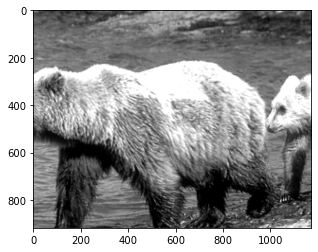

In [ ]:
# We can, for example, show the first image in the stimulus dataset:
plt.imshow(natural_scenes['images'][0], cmap='gray');